# Hardness Prediction Model
### The function fron "common_functions.ipynb" is called to run the program
### The trained model is taken from "elongation_model_files" folder

# Prediction Model

# Prediction from the train data to validate the prediction code.
## To identify the best weights of individual models in Ensemble model

#### Import Libraries

In [1]:
#Import Libraries
from pymatgen.core.composition import Composition, Element
from pymatgen.core.structure import SiteCollection
from matminer.featurizers.composition.alloy import Miedema, WenAlloys,YangSolidSolution
from matminer.featurizers.composition import ElementFraction
from matminer.featurizers.conversions import StrToComposition
from matminer.utils.data import MixingEnthalpy, DemlData
from matminer.utils import data_files #for importing "Miedema.csv" present inside package of Matminer library
from matplotlib.ticker import MultipleLocator # for minor tick lines
import seaborn as sns

import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import os
import matplotlib.pyplot as plt

ef= ElementFraction()
stc = StrToComposition()

#### Import "Midema"

In [2]:
# Import csv files "Midema" to calculte input features
elem_prop_data = pd.read_csv('Miedema.csv')
VEC_elements = elem_prop_data.set_index('element')['valence_electrons'].to_dict()
shear_modulus_g = elem_prop_data.set_index('element')['shear_modulus'].to_dict()
bulk_modulus_b = elem_prop_data.set_index('element')['compressibility'].to_dict()

#### Import "Hardness" Datasets and visualization of element in alloy system

In [3]:
# Load hardness data and Featurization
df = pd.read_csv('elongation.csv')

In [4]:
def fab_cluster(df):

    df.Fabrication_type = df.Fabrication_type.fillna('OTHER')

    df.Fabrication_type.replace(to_replace=["CAST"], value="CAT-A", inplace= True)


    df.Fabrication_type.replace(to_replace=["OTHER","Unknown","WROUGHT"], value="CAT-B", inplace= True)    
    df.Fabrication_type.replace(to_replace=["POWDER"], value="CAT-C", inplace= True) 

    df.Fabrication_type.replace(to_replace=["ANNEAL"], value="CAT-D", inplace= True)   
    
    return(df)

## 1.2 Automatic Featurization and properties calculations

In [5]:
%run common_functions.ipynb

df = featurization(df)

df = df_element_number(df)
#df = data_elimination(df)
df= fab_cluster(df)
df, df_input_target = properties_calculation(df)


StrToComposition:   0%|          | 0/353 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/353 [00:00<?, ?it/s]

## $R^2$ plot function for the prediction model

In [6]:
def r2_new(y_test,ideal_weighted_ensemble_prediction):
    import sklearn.metrics
    from sklearn.metrics import r2_score

    ideal_weighted_ensemble_prediction


    #Predict on test data
    y_test
    a=0.2 # Percentage error range
    r2_mean = r2_score(y_test,ideal_weighted_ensemble_prediction)
    plt.figure(figsize=(4,4),dpi=600)

    # plot x=y line 
    x_line = np.linspace(0, 1200, 1000)

    sns.lineplot(x=x_line, y=x_line,color='black',lw=0.75)

    print('Test R2 score: ', r2_mean)

    test_r2 = sns.regplot(x=y_test,y=ideal_weighted_ensemble_prediction,ci=None,scatter_kws=dict(s=8,color='r'),fit_reg=False)
    test_r2.set(title='Test $R^2 = $' +str(round(r2_mean,2))+' with 20% Error region')
    test_r2.set_xlabel("Real Test Targets", fontsize = 9)
    test_r2.set_ylabel("Predicted Test Value", fontsize = 9)

    Y1 = x_line*(1+a)
    Y2 = x_line*(1-a)

    sns.lineplot(x=x_line,y=Y1,lw=0.5,color='b',alpha=.2)
    sns.lineplot(x=x_line,y=Y2,lw=0.5,color='b',alpha=.2)

    plt.fill_between(x_line, Y1,x_line,color='b',alpha=.2)
    plt.fill_between(x_line, Y2,x_line,color='b',alpha=.2)

    test_r2.figure.savefig('plots\\elongation\\r2_el_ideal_wt.pdf',dpi=1200)


12/12 [==============================] - 0s 1ms/step
Max $R^2$ of  0.7909346475345145  obained with w1= 0.3  w2= 0.3  w3= 0.2  and w4= 0.3
Test R2 score:  0.7049368852169957


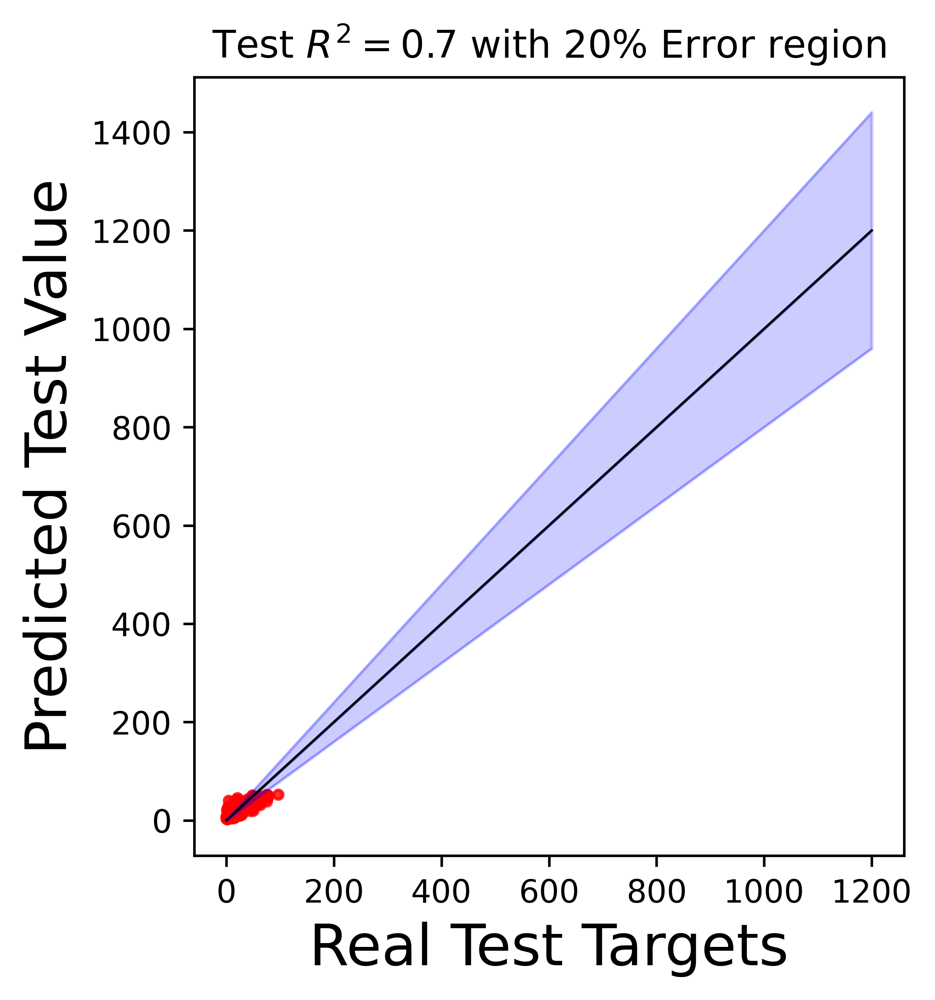

In [7]:
%run common_functions.ipynb
input_pcc = ['$\delta$', 'ΔTm', 'VEC', 'ΔB', 'ΔG', 'ΔSmix', 'ΔHmix']

r2_new(df["Elongation (%)"],prediction_model(df,input_pcc,prop="Elongation (%)", path='elongation_model_files\\'))

# Ideal weights evaluated from running Train + Test datasets  

In [8]:
ideal_weights=[0.3,0.3,0.2,0.3]

# Additional Evaluation data to test EL predictions
## New data for testing


### Out of six data four were used in training and 2 for evaluation. The 2nd and 4th are for evaluation

In [9]:
df_new = pd.read_csv('test_new_hv.csv')

In [10]:
%run common_functions.ipynb

df = df_new
df = featurization(df)

df = df_element_number(df)
df = data_elimination(df)
df= fab_cluster(df)
df, df_input_target = properties_calculation(df)

StrToComposition:   0%|          | 0/6 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/6 [00:00<?, ?it/s]

Total Datasets 6
Datasets eleminated due to fewer number of element occurance: 0
Datasets eleminated due to number of element in alloy: 0
Total Datasets for the hardness prediction 6


In [11]:
prediction_model_new(df,input_pcc,ideal_weights, path='elongation_model_files\\')

1/1 [==============================] - 0s 79ms/step


array([15.91544333, 15.48130217, 15.21382818, 12.72541223, 11.47588553,
       11.57550631])

1/1 [==============================] - 0s 79ms/step
Test R2 score:  -0.6804347802524164


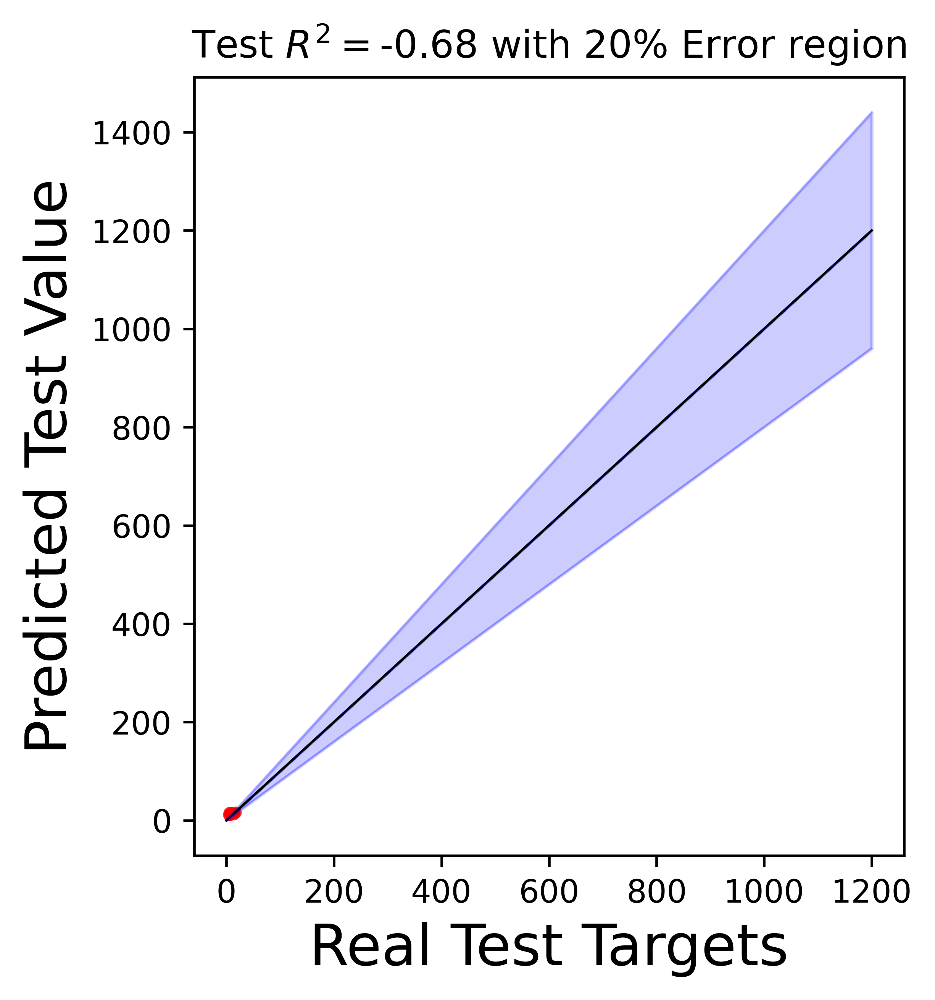

In [12]:
r2_new(df["Elongation (%)"],prediction_model_new(df,input_pcc,ideal_weights, path='elongation_model_files\\'))

# Ternary Plots for two alloys system
## The element composition is same and just the element is replaced. 
## So, list "element1" & "element2" is valid for all alloy system
##  "element1" & "element2" is confirmed from the  'rhea_plot.csv'.

In [13]:
df_plot = pd.read_csv('rhea_plot.csv')

In [14]:
element1=np.array([0,0,0,0,0,0,0,0,0,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.2,0.2,0.2,0.2,0.2,0.2,0.3,0.4,0.5,0.6,0.7,0.3,0.3,0.3,0.3,0.4,0.5,0.6,0.4,0.4,0.5])

element2 = np.array([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0,0,0,0,0,0,0,0,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.2,0.2,0.2,0.2,0.2,0.3,0.4,0.5,0.6,0.3,0.3,0.3,0.4,0.5,0.4])
print(len(element1),len(element2))
df_check= pd.DataFrame()
df_check["comp"] = 1-element1-element2
df_check["el1"] = element1
df_check["el2"] = element2

df_check["Sum"]=df_check.sum(axis=1)

55 55


## Ternary Plots for 8 alloys for 2 base system.
### The Fabrication route "CAT-A" is taken for all.

In [15]:
%run common_functions.ipynb

# Alloy System-1
EL_1b = ternary_plot(df_plot.iloc[:,[2]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(ZrHfNb)','Ti',' \t.\t Ta'],baxis_min=0.1, model_path='elongation_model_files\\')

EL_1d = ternary_plot(df_plot.iloc[:,[3]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(ZrHfNb)','W','\t. \t Ta'],baxis_min=0.1, model_path='elongation_model_files\\')

EL_1f = ternary_plot(df_plot.iloc[:,[4]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(ZrHfNb)','Mo','\t. \t Ta'],baxis_min=0.1, model_path='elongation_model_files\\')

EL_1h = ternary_plot(df_plot.iloc[:,[5]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(ZrHfNb)','Cr','\t. \t W'],baxis_min=0.1, model_path='elongation_model_files\\')


# Alloy System-2
EL_2b = ternary_plot(df_plot.iloc[:,[6]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(VNbTa)','Cr','\t. \t W'],baxis_min=0.1, model_path='elongation_model_files\\')

EL_2d = ternary_plot(df_plot.iloc[:,[7]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(VNbTa)','Zr','\t. \t W'],baxis_min=0.1, model_path='elongation_model_files\\')

EL_2f = ternary_plot(df_plot.iloc[:,[8]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(VNbTa)','Hf','\t. \t W'],baxis_min=0.1, model_path='elongation_model_files\\')

EL_2h = ternary_plot(df_plot.iloc[:,[9]],input_pcc,ideal_weights,element1,element2,fab_cat="CAT-A", pole_labels=[ '(VNbTa)','Mo','\t. \t Ti'],baxis_min=0.1, model_path='elongation_model_files\\')

StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


StrToComposition:   0%|          | 0/55 [00:00<?, ?it/s]

ElementFraction:   0%|          | 0/55 [00:00<?, ?it/s]

2/2 [==============================] - 0s 0s/step
(55,) (55,) (55,)


In [16]:
df_result_ternary = pd.DataFrame()
df_result_ternary['x'] = pd.DataFrame(element1)
df_result_ternary['y'] = pd.DataFrame(element2, columns=['x'])
df_result_ternary['EL_1b'] = pd.DataFrame(EL_1b)
df_result_ternary['EL_1d'] = pd.DataFrame(EL_1d)
df_result_ternary['EL_1f'] = pd.DataFrame(EL_1f)
df_result_ternary['EL_1h'] = pd.DataFrame(EL_1h)

df_result_ternary['EL_2b'] = pd.DataFrame(EL_2b)
df_result_ternary['EL_2d'] = pd.DataFrame(EL_2d)
df_result_ternary['EL_2f'] = pd.DataFrame(EL_2f)
df_result_ternary['EL_2h'] = pd.DataFrame(EL_2h)

In [17]:
df_result_ternary

,x,y,EL_1b,EL_1d,EL_1f,EL_1h,EL_2b,EL_2d,EL_2f,EL_2h
0,0.0,0.0,31.371458,31.371458,31.371458,31.371458,20.968475,20.968475,20.968475,20.968475
1,0.0,0.1,25.946819,25.946819,25.946819,18.675904,15.129988,15.129988,15.129988,22.127539
2,0.0,0.2,20.359360,20.359360,20.359360,13.079338,6.933958,6.933958,6.933958,23.013202
3,0.0,0.3,17.960201,17.960201,17.960201,12.807271,6.640303,6.640303,6.640303,24.544011
4,0.0,0.4,16.353893,16.353893,16.353893,12.904071,7.488220,7.488220,7.488220,25.117765
5,0.0,0.5,14.927621,14.927621,14.927621,12.555052,7.772304,7.772304,7.772304,28.608002
6,0.0,0.6,13.613580,13.613580,13.613580,12.168237,7.407957,7.407957,7.407957,28.133320
7,0.0,0.7,12.622768,12.622768,12.622768,12.239699,6.313755,6.313755,6.313755,26.719365
8,0.0,0.8,15.252037,15.252037,15.252037,11.576479,9.309078,9.309078,9.309078,25.969662
9,0.0,0.9,17.961692,17.961692,17.961692,12.442454,18.244768,18.244768,18.244768,24.052921


In [19]:
df_result_ternary.to_csv('df_result_ternary_el.csv')  

In [ ]:
df_pred = pd.read_csv('pred.csv')

In [ ]:
%run common_functions.ipynb

df = df_pred
df = featurization(df)

df = df_element_number(df)
df = data_elimination(df)
df= fab_cluster(df)
df, df_input_target = properties_calculation(df)

In [ ]:
preds=prediction_model_new(df,input_pcc,ideal_weights, path='elongation_model_files\\')

In [ ]:
preds

In [ ]:
import matplotlib.ticker as tck
plt.figure(figsize=(12,6))

x = np.arange(0,1.05,0.05)
x_label = np.arange(0.1,1.1,0.1)

plt.xlim(0.01, 1)
plt.ylim(0, 44)
#values = range(len(x))
plt.xticks(x_label)

plt.rcParams.update({'font.size': 30})
plt.gca().yaxis.set_minor_locator(tck.AutoMinorLocator(2))
plt.gca().xaxis.set_minor_locator(tck.AutoMinorLocator(2))

plt.plot(x,preds,'-ok')
plt.xlabel("Doping fraction of $Nb$")
plt.ylabel("Elongation (%)")
plt.title("b) Elongation study on $CoCrNiNb_x$")
plt.grid(alpha=0.25)
plt.grid(which='minor',alpha=0.25)
plt.savefig("plots\\elongation\\EL_nana.png",dpi=1200, bbox_inches='tight')
plt.show()